# CS/ECE 181: Programming Assignment 2

<small>v1.0.1</small>

**DUE DATE**: February 28, 11:59pm Pacific via GauchoSpace

* The format & procedure is the same as last time
* You can save a copy of this document in your own Drive and work on it in your own Colab
* You can add comments, multiple cells, etc. Just make sure to explain what you did so that we can give you partial credit.
* When you're done, select `File > Download .ipynb` and drop the file in the Programming Assignment #2 folder on GauchoSpace.
* Remember, you are expected to work alone. You can discuss a solution approach with your peers, but you must not copy their code. The implementation must be yours. If you google how to do stuff (or use open-source code or libraries) you must acknowledge your sources.

## 0. Getting Started

### Loading the data

This assignment comes with a bunch of data. You can load it as follows:

In [1]:
!wget https://www.dropbox.com/s/r5k3n1qe76yzhln/cs181_prog2_data.zip?dl=0

--2021-03-01 05:38:49--  https://www.dropbox.com/s/r5k3n1qe76yzhln/cs181_prog2_data.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:601a:18::a27d:712
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/r5k3n1qe76yzhln/cs181_prog2_data.zip [following]
--2021-03-01 05:38:49--  https://www.dropbox.com/s/raw/r5k3n1qe76yzhln/cs181_prog2_data.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc980c414b2bfba48a1474e1426d.dl.dropboxusercontent.com/cd/0/inline/BJ1_iKmS6179mEMj4VKHPmXDRoXCojyGlei9_M1-44Jo9d-pw-boRH7e8xZrskuuMj9eL_-TKD2bThwCzBYcgCb_T61czHTSBvbuWHS6SCK-91A2IMdsFBXMlFVxcy4gZxc/file# [following]
--2021-03-01 05:38:50--  https://uc980c414b2bfba48a1474e1426d.dl.dropboxusercontent.com/cd/0/inline/BJ1_iKmS6179mEMj4VKHPmXDRoXCojyGlei9_M1-44Jo9d-pw-boRH7e8xZrskuuMj9eL_-TKD2bThwCzB

And unzip it (we'll need it later):

In [2]:
import zipfile
with zipfile.ZipFile('cs181_prog2_data.zip?dl=0', 'r') as zip_ref:
   zip_ref.extractall('.')

This should extract all the files into a local 'cs181_prog2_data' folder. You can inspect the contents of the folder by clicking on the "Files" button on the very left of this screen (fourth button from the top)


### Intro to OpenCV

Although some parts of this exercise could be done with scikit-image, we will be focusing on a different library this time: [OpenCV](https://opencv.org).

Built to provide a common infrastructure for computer vision applications, OpenCV has become a comprehensive set of both classic and state-of-the-art computer vision (and some machine learning) algorithms.
According to their own documentation, OpenCV has a user community of more than 47,000 people and has been downloaded over seven million times. That's pretty impressive! As an open-source project, it is very easy for researchers, businesses, and government bodies to utilize and modify already available code.

Usually it is a bit of a pain to install, which is probably why Google Colab is providing us with a pre-installed version:

In [3]:
import cv2
cv2.__version__

'4.1.2'

You should see version 4.1.2 is installed.

If you fell in love with the great documentation and consistent API of scikit-image, you're in for a rude awakening. Primarily a C/C++ library, the Python interface to OpenCV is merely a wrapper around the core library. This allows OpenCV to maintain its execution speed, but often compromises usability. A lot.
<br><small>I mean it's a complete dumpster fire. Usually when I write OpenCV code, I need to have a second window open with the documentation (because the API is inconsistent and unintuitive), and a third window with the GitHub repo (because the documentation is wrong). Which is probably why it's still a good business to write books about how to use OpenCV... On that note, you might be interested in [[1](https://github.com/mbeyeler/opencv-python-blueprints),[2](https://github.com/mbeyeler/opencv-machine-learning)], which comes with free GitHub code (also, let me know if you want a copy).</small>

### Gettin help with OpenCV

You can always start typing and let Colab autocomplete your code. When a function is typed out, you should see the docstring appear that tells you what arguments the function takes.

However, if you need more details, the best starting point for getting help is the [OpenCV documentation](https://docs.opencv.org/4.1.2) - make sure you're reading the docs for the correct version!!

You will notice that the docs are tailored towards the C++ interface. So this is just your first stop to learn about each function is doing and what arguments it takes. (You may also want to look through the tutorials.) If you can understand what a certain function does in OpenCV, all that is left is converting the syntax from C++ to Python.
For example, [resize](https://docs.opencv.org/4.1.2/da/d54/group__imgproc__transform.html#ga47a974309e9102f5f08231edc7e7529d) explains how to resize an image, but its arguments are `InputArray src`, `OutputArray dst`, `Size dsize` etc. This tells you that the first two arguments are arrays and the third is a scalar. However, in Python the images are just plain NumPy arrays rather than `Array` objects, which leads us to the next point.

### Dealing with Images in OpenCV

For the purpose of this assignment, the most important thing to know is how OpenCV stores images.

So far we have mostly dealt with grayscale images, but you may know that color images are usually stored as RGB images.
The important thing to know is that OpenCV stores them not as RGB, but as BGR images (why?? ask OpenCV's [founder](https://learnopencv.com/why-does-opencv-use-bgr-color-format/)).

<small>If you don't know what I mean, consider a grayscale image with 30 pixel height and 40 pixel width. This would usually be stored as a 2D NumPy array of shape 30x40, usually with values between 0 and 255 (8 bit encoding).
An RGB image of the same dimensions would be stored as a 3D NumPy array of shape 30x40x3. The slice `img[:, :, 0]` would be a 30x40 array whose values (between 0 and 255) represent the amount of red for each pixel, `img[:, :, 1]` has all the green values, and `img[:, :, 2]` has all the blue values.
However, not in OpenCV: `img[:, :, 0]` is the blue channel, `img[:, :, 1]` is the green channel, and `img[:, :, 2]` is the red channel (i.e., the red and blue channels are swapped).</small>


# 1. Loading Images

OK let's get started.
Let's not worry about color just yet, but start by loading a grayscale image. Similar to scikit-image, OpenCV has its own load function:

In [4]:
img_box = cv2.imread('cs181_prog2_data/box.png', cv2.IMREAD_GRAYSCALE)

The second argument tells OpenCV whether to load the image color or grayscale.
Because of the RGB <=> BGR thing, we won't use Matplotlib to plot the image, but OpenCV's own `imshow` function (which Colab had to patch). It doesn't really matter for grayscale images, but we'll use `cv2_imshow` nonetheless for the sake fo consistency:

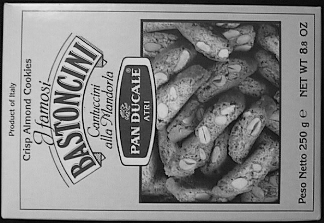

In [5]:
from google.colab.patches import cv2_imshow
cv2_imshow(img_box)

This should look familiar. The box is also present in the following scene:

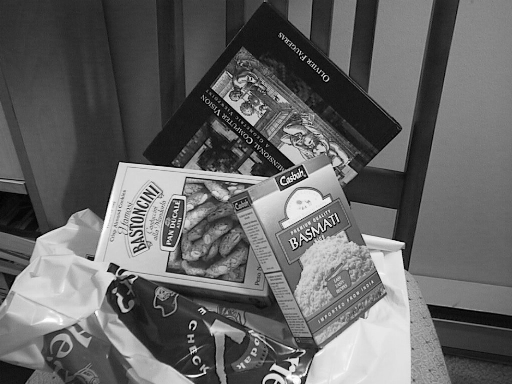

In [6]:
img_scene = cv2.imread('cs181_prog2_data/box_in_scene.png', cv2.IMREAD_GRAYSCALE)
cv2_imshow(img_scene)

OK, we're all set! Let's use these two images in our first exercise.

# 2. Feature Matching (16 pts)

In this section, we want to calculate the homography transform that maps the Bastoncini box shown in `img_box` to `img_scene`.

We will use first detect interesting points in the two images and extract meaningful feature descriptors for these points. We will then match features between the two images using RANSAC and the ratio test.
Finally, we will solve for the homography that connects the two images.

### 2.1 TODO Detect keypoints using ORB (1 pt)

The first step is feature detection.

Based on the lecture, our first choice might be to use SIFT (or SURF).
Although the SIFT patent has expired, it is not usable in older OpenCV versions, such as 4.1 that is installed in Colab. So we will have to use free alternatives instead.

One such alternative is [Oriented FAST and Rotated BRIEF (ORB)](https://en.wikipedia.org/wiki/Oriented_FAST_and_rotated_BRIEF).
In the cell below, use ORB to detect keypoints in both `img_box` and `img_scene`:


In [7]:
import numpy as np


orb = cv2.ORB_create()
kp_box = orb.detect(img_box,None)
kp_scene = orb.detect(img_scene,None)

<small>Hint: You may want to search the [OpenCV 4.1.2 documentation](https://docs.opencv.org/4.1.2) for this. Make sure you're reading the docs of the right version!!</small>

If you did it right, your `kp_box` should contain a list of `Keypoint` objects for `img_box`, each of which contains a number of attributes that inclues the (x,y) location at which the keypoint was found. For example, the first one was found at (x, y) = (132, 90):


In [8]:
kp_box[0].pt

(132.0, 90.0)

### 2.2 Visualize the keypoints

Now we can visualize the keypoints of the two images (one image at a time) using `cv2.drawKeypoints` and `cv2_imshow`:

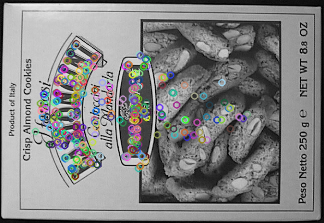

In [9]:
cv2_imshow(cv2.drawKeypoints(img_box, kp_box, None))

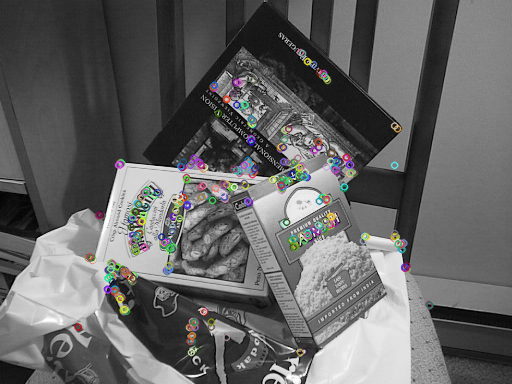

In [10]:
cv2_imshow(cv2.drawKeypoints(img_scene, kp_scene, None))

### 2.3 TODO Extract ORB feature descriptors (1 pt)

Now that we have found some keypoints, we want to compute ORB feature descriptors for them:

In [11]:
kp_box, desc_box = orb.detectAndCompute(img_box,None)
kp_scene, desc_scene = orb.detectAndCompute(img_scene,None)

Keypoints for which no descriptors could be computed will be removed - that's why the function also returns `kp_box` in addition to `desc_box`.
If you did it right, `desc_box` will contain a list of feature descriptors of length 32; e.g., for the first keypoint:

In [12]:
kp_box[0].pt, np.size(desc_box[0])

((132.0, 90.0), 32)

### 2.4 TODO Perform feature matching using FLANN (3 pts)

To perform feature matching, we will use `cv2.FlannBasedMatcher`. Search the docs to call the matcher with algorithm `FLANN_INDEX_LSH`, `table_number=6`, `key_size=12`, and `multi_probe_level=1`.

Make sure your matcher returns the 2 best matches.

In [13]:
index_params= dict(algorithm=6, # FLANN_INDEX_LSH
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
search_params = {'checks': 50}
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(desc_box,desc_scene,k=2)

Finally, visualize the matches using `cv2.drawMatchesKnn`:

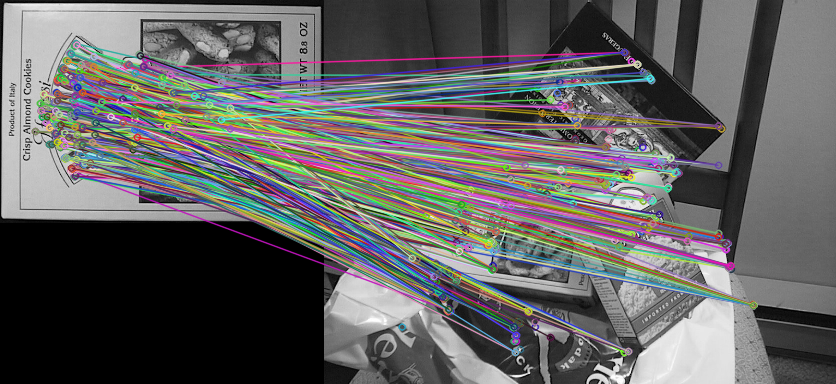

In [14]:
cv2_imshow(cv2.drawMatchesKnn(img_box, kp_box, img_scene, kp_scene, matches, None))

As you can see, we get a good mix of true and false matches. To weed out the false matches, we need to implement the ratio test.

### 2.5 TODO Implement the ratio test (2 pt)

Each entry of `matches` should now consist of 2 `DMatch` objects: these are the two best matches in `img_scene` for each keypoint in `img_box`:


In [15]:
matches[0]

[<DMatch 0x7f25ab05ab50>, <DMatch 0x7f25ab05ac10>]

Each `DMatch` object has a `distance` field as well as two indices:
- the index of the `img_box` keypoint with which it matches best (`queryIdx`) and
- the index of the `img_scene` keypoint it belongs to (`trainIdx`)  

In [16]:
kp0_best_match = matches[0][0]
kp0_best_match.queryIdx, kp0_best_match.trainIdx, kp0_best_match.distance

(0, 328, 75.0)

The next step is thus to filter out poor matches with a ratio test.
For each match, compare the distance of the best match with the distance of the second-best match. Store all matches whose best distance is smaller than 80% of the second-best distance in a list:

In [17]:
# store all the good matches as per Lowe's ratio test.
good = []
for m, n in matches:
  if m.distance < 0.80* n.distance:
    good.append(m)
    
print('Number of good matches:', len(good))

Number of good matches: 39


## 2.6 TODO Calculate the homography (1 pt)

Now we want to use the built-in OpenCV functions to find the homography matrix using RANSAC.

Before we move on, we want to make sure we identified enough matches, otherwise we shouldn't continue:

In [18]:
MIN_MATCH_COUNT = 10
if len(good) < MIN_MATCH_COUNT:
    raise ValueError("Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT))

Now find the homography matrix that transforms `box_pts` into `scene_pts` using `cv2.findHomography`. Make sure to use the RANSAC method with `ransacReprojThreshold` 5 (although other values might work as well):

In [19]:
# Make `box_pts` and `scene_pts` an Nx2 matrix that contains the (x,y) coords
# of each keypoint (and make sure it's stored as a float):
import numpy as np
box_pts = np.float32([ kp_box[m.queryIdx].pt for m in good ]).reshape(-1,2)
scene_pts = np.float32([ kp_scene[m.trainIdx].pt for m in good ]).reshape(-1,2)

H, mask = cv2.findHomography(box_pts,scene_pts,cv2.RANSAC,5.0)

If you did it right, your `H` should look as close as possible to an affine transformation:

In [20]:
H

array([[ 4.70234973e-01, -1.36666344e-01,  1.17288061e+02],
       [ 2.49718179e-02,  4.55473873e-01,  1.59222251e+02],
       [-1.79053589e-04, -1.71282868e-04,  1.00000000e+00]])

## 2.7 TODO Highlight the box in the scene (2 pts)

The last step is to visualize the outline of the box in the scene image.

We do this in two steps. First, you need to apply `H` to the corners of the box. `corners_box` is a 4x1x2 matrix that contains the image coordinates of the 4 corners of the box in `img_box`:

In [21]:
matches_mask = mask.ravel().tolist()
h, w = img_box.shape
corners_box = np.float32([[0,0], 
                          [0,h-1], 
                          [w-1,h-1], 
                          [w-1,0]]).reshape(-1, 1, 2)

Then you need to apply `H` to these coordinates using `cv2.perspectiveTransform`:

In [22]:
corners_scene = cv2.perspectiveTransform(corners_box,H)

The result can then be visualized with `cv2.polylines` and `cv2_imshow`:

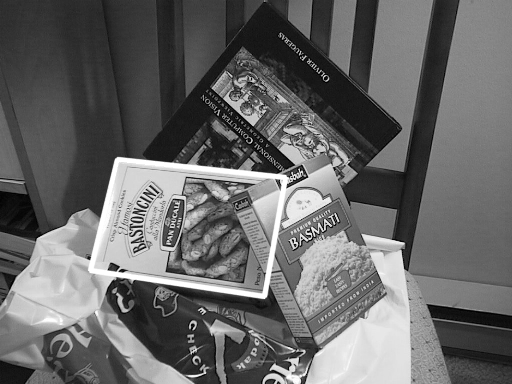

In [23]:
from copy import deepcopy
cv2_imshow(cv2.polylines(deepcopy(img_scene), [np.int32(corners_scene)], True,
                         255, 3, cv2.LINE_AA))

The expected result looks something like this:

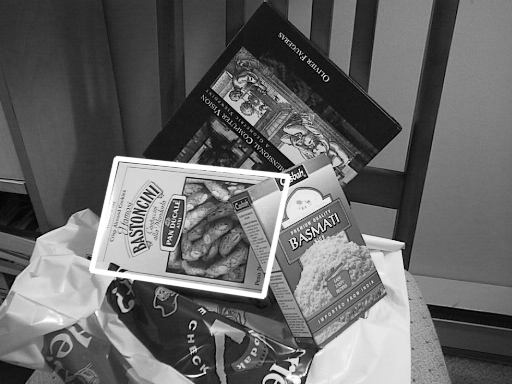

In [24]:
cv2_imshow(cv2.imread('cs181_prog2_data/box_expected.png', cv2.IMREAD_GRAYSCALE))

## 2.8 TODO Estimate the affine transformation yourself using RANSAC (6 pts)

From the lectures and quizzes we already know that we're looking for an affine transformation, not for a perspective transformation. So we could also solve directly for an affine projection matrix. Unfortunately, there is no easy way to do this with OpenCV, but we can write our own.

In the following more open-ended task, implement your own simple RANSAC algorithm from scratch. It should work as follows:

1. Choose a number of potential inliers:
   - Pick the smallest number of keypoints from `box_pts`, `scene_pts` needed to fit an affine projection matrix
   - Use function `pred_affine` to predict the homography matrix for these points
2. Validate the model on all other points:
   - For all other points, use function `calc_test_err` to calculate the Euclidean distance between predicted and ground-truth coordinates in the scene image
   - Compare each error to `max_err` and use that to count the number of inliers
3. Store the best model:
   - If the model is better than your previous one, store it.
   - Rinse and repeat for a number of RANSAC iterations `max_iter`
   - Then output the best model

You may find the following functions useful, but feel free to adapt the code or write your own instead:

In [25]:
def random_partition(n, n_data):
    """Choose `n` random rows of data

    Returns `n` random rows of data (and also the other `len(data)-n` rows)

    Parameters
    ----------
    n : int
        Number of rows to choose at random
    n_data : int
        Number of rows in the data

    Returns
    -------
    idxs1 : list of `n` indices
        `n` rows chosen at random
    idxs2 : list of `len(data)-n` indices
        all the other rows
        
    """
    all_idxs = np.arange(n_data)
    np.random.shuffle(all_idxs)
    idxs1 = all_idxs[:n]
    idxs2 = all_idxs[n:]
    return idxs1, idxs2

In [26]:
def pred_affine(box_pts, scene_pts):
    """Predict an affine projection matrix

    Computes the affine transformation that relates 3 pairs of points.

    Parameters
    ----------
    box_pts, scene_pts : 3x2 NumPy array
        3 pairs of keypoints in the box and scene images; each with their own
        (x,y) values

    Returns
    -------
    H : 3x3 NumPy array
        The estimated homography matrix

    """
    H = np.zeros((3, 3))
    H[:2, :] = cv2.getAffineTransform(box_pts, scene_pts)
    H[-1, -1] = 1
    return H

In [27]:
def calc_test_err(box_pts, scene_pts, H):
    """Calculates the Euclidean distance between each pair of points

    Parameters
    ----------
    box_pts, scene_pts : Nx2 NumPy array
        Keypoints in the box and scene images; each with their own (x,y) values
    H : 3x3 NumPy array
        Homography matrix

    Returns
    -------
    err : Nx1 NumPy array
        The Euclidean distance between the two points for each pair
        
    """
    b = np.ones((box_pts.shape[0], 1))
    z = np.concatenate((box_pts,b), axis = 1)
    c = np.dot(H,np.transpose(z))
    c = np.transpose(c)
    errs = []
    for i in range(box_pts.shape[0]):
      err = np.linalg.norm(scene_pts[i] - c[i,0:2])
      errs.append(err)
    return np.array(errs)

If you choose to use the above functions, you may first want to experiment with them a little to get a better understanding of how they work.

Then, implement RANSAC in the following function:

In [28]:
def run_affine_ransac(box_pts, scene_pts, max_err, max_iter):
    """Use RANSAC to estimate an affine transformation

    Parameters
    ----------
    box_pts, scene_pts : Nx2 NumPy array
        A number of corresponding (x,y) values
    max_err : float
        Max Euclidean distance above which a match is considered an outlier
    max_iter : int
        Number of RANSAC iterations

    Returns
    -------
    best_H : 3x3 NumPy array
        The best homography matrix
    best_num_inliers : int
        Number of inliers achieved with the best homography matrix
    """
    # For reproducibility, always use the same seed:
    np.random.seed(42)
    # Start at iteration 0, increment until you reach `max_iter`:
    iterations = 0
    # We'll store the best result here, but initialize with 0:
    best_num_inliers = 0
    best_H = None
    # Number of points needed to predict the homography:
    num_pts = 3

    while iterations < max_iter:
        select,other = random_partition(num_pts,box_pts.shape[0])
        box_select = []
        scene_select = []
        box_other = []
        scene_other = []
        num_inliers = 0
        for i in select:
          box_select.append(box_pts[i])
          scene_select.append(scene_pts[i])
        for i in other:
          box_other.append(box_pts[i])
          scene_other.append(scene_pts[i])
        H = pred_affine(np.array(box_select),np.array(scene_select))
        errs = calc_test_err(np.array(box_other),np.array(scene_other),H)
        for err in errs:
          if err < max_err:
            num_inliers += 1
        if num_inliers > best_num_inliers:
          best_num_inliers = num_inliers
          best_H = H
        iterations += 1
    return best_H, best_num_inliers

Make sure to choose sensible values for `max_err` and `max_iter` (see Week 4, Part 2), and run RANSAC:

In [29]:
H_affine, num_inliers = run_affine_ransac(box_pts,scene_pts,1,100)
print('num_inliers:', num_inliers)
print('H:', H_affine)

num_inliers: 18
H: [[ 5.28432430e-01 -1.15740738e-01  1.15175758e+02]
 [ 6.91717571e-02  5.14403278e-01  1.56343415e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


To verify the result, we can again project the corner points of the box into the scene image and visualize the outline of the box:

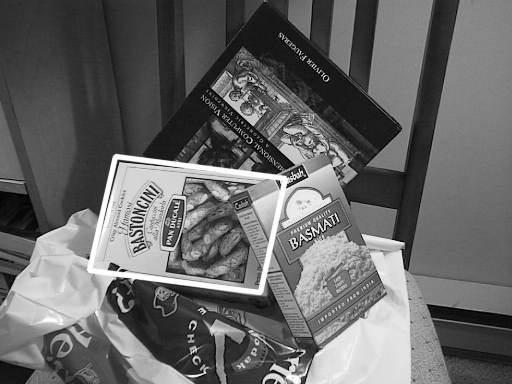

In [30]:
h, w = img_box.shape
corners_box = np.float32([[0,0], 
                          [0,h-1], 
                          [w-1,h-1], 
                          [w-1,0]]).reshape(-1,1,2)
corners_scene = cv2.perspectiveTransform(corners_box, H_affine)
cv2_imshow(cv2.polylines(deepcopy(img_scene), [np.int32(corners_scene)], True,
                         255, 3, cv2.LINE_AA))

If you did it right, the result should look pretty much the same as in Section 2.6.

In fact, we can compare the mean error between the two methods, and should get very similar values:

In [31]:
np.mean(calc_test_err(box_pts, scene_pts, H))

39.15173452432686

In [32]:
np.mean(calc_test_err(box_pts, scene_pts, H_affine))

30.752603243186147

# 3. 3D Reconstruction (8 pts)

In this section, we want to reconstruct a scene using structure from motion.
For this, we will be using a famous dataset called fountain-P11, depicting a fancy fountain in Switzerland that was imaged from different viewpoints:

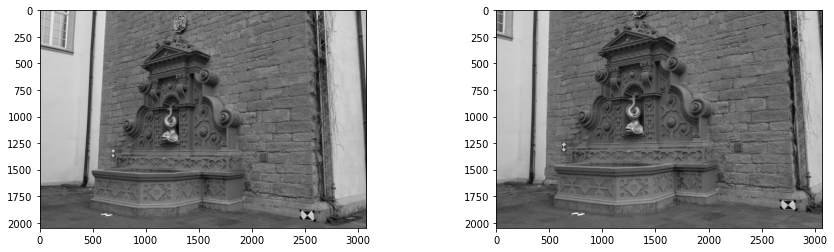

In [33]:
img1 = cv2.imread('cs181_prog2_data/fountain_dense/0001.png', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('cs181_prog2_data/fountain_dense/0002.png', cv2.IMREAD_GRAYSCALE)

import matplotlib.pyplot as plt
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 4))
ax1.imshow(img1, cmap='gray')
ax2.imshow(img2, cmap='gray')

## 3.1 TODO Feature matching (3 pts)

The first step is again feature matching. By now you should know how it works. Below, detect and extract ORB features and use the FLANN-based matcher to extract the two best matches for each keypoint:

In [34]:
cv2.setRNGSeed(42)
kp1 = orb.detect(img1,None)
kp2 = orb.detect(img2,None)
kp1, desc1 = orb.compute(img1,kp1)
kp2, desc2 = orb.compute(img2,kp2)

In [35]:
flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(desc1,desc2,k=2)

Then filter out poor matches with the Lowe ratio test.
For each match, compare the distance of the best match with the distance of the second-best match. Store all matches whose best distance is smaller than 80% of the second-best distance in a list:

In [36]:
# store all the good matches as per Lowe's ratio test.
good = []
for m, n in matches:
    if m.distance < 0.59 * n.distance:
      good.append(m)

The good matches can then be visualized as follows:

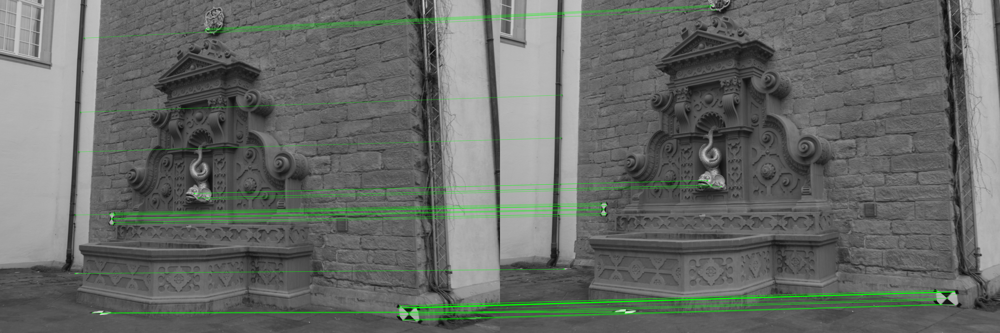

In [37]:
if len(good) > MIN_MATCH_COUNT:
    p1 = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    p2 = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                       singlePointColor = None,
                       flags = 2)
    cv2_imshow(cv2.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params))

## 3.2 TODO Find the fundamental matrix (1 pt)

The next step is to estimate the fundamental matrix using `cv2.findFundamentalMat` and the 8-point algorithm:

In [38]:
F, mask = cv2.findFundamentalMat(p1,p2,cv2.FM_RANSAC)
F

array([[-1.16576112e-07,  1.77679056e-06, -4.26216718e-03],
       [-1.67075381e-06,  1.26747354e-07,  1.08827046e-02],
       [ 4.81609730e-03, -1.17621656e-02,  1.00000000e+00]])

## 3.3 TODO Find the essential matrix (2 pts)

Had we taken the pictures ourselves, we would have had to go through the entire camera calibration procedure to recover the intrinsic camera matrix and the distortion coefficients.
Luckily, these parameters are known for the camera that took the fountain dataset, so we can go ahead and hardcode these values in our code.

Using the fundamental matrix `F` and the intrinsic camera matrix, we can now calculate the essential matrix `E`:

In [39]:
K = np.array([[2759.48, 0, 1520.69],
              [0, 2764.16, 1006.81],
              [0, 0, 1]])
E = np.transpose(K).dot(F).dot(K)
E

array([[ -0.88769561,  13.55272626,  -7.31414745],
       [-12.74391565,   0.96842336,  23.41137508],
       [  8.15892564, -24.69115618,   0.97815051]])

We are then finally able to estimate the second camera's pose:

In [40]:
mask = mask.astype(np.bool).flatten()
_, R, t, _ = cv2.recoverPose(E, p1[mask], p2[mask])
print('R:', R)
print('t:', t)

R: [[ 0.99921304  0.03558635 -0.01751897]
 [-0.03637022  0.99824807 -0.04666909]
 [ 0.0158275   0.04726953  0.99875677]]
t: [[-0.84594611]
 [-0.24448837]
 [-0.47392047]]


## 3.4 TODO Reconstructing the 3D coordinates (2 pts)

If you remember our reprojection lecture (and the midterm), we can use the intrinsic camera matrix to project 2D image points to 3D coordinates:

In [41]:
p1_hom = cv2.convertPointsToHomogeneous(p1[mask])[:,0,:]
p2_hom = cv2.convertPointsToHomogeneous(p2[mask])[:,0,:]

# Use the intrinsic camera matrix to project from 2D image coordinates
# `p1_hom` and `p2_hom` to 3D world coordinates `p1_norm` and `p2_norm`:
p1_norm = np.dot(p1_hom,np.transpose(np.linalg.inv(K)))
p2_norm = np.dot(p2_hom,np.transpose(np.linalg.inv(K)))

p1_norm = cv2.convertPointsFromHomogeneous(p1_norm)[:, 0, :]
p2_norm = cv2.convertPointsFromHomogeneous(p2_norm)[:, 0, :]

We can then reconstruct the 3D points by triangulation. For this we need the [R|t] matrices of the two cameras: 

In [42]:
# [R|t] matrix for camera 1:
Rt1 = np.array([[1,0,0,0],[0,1,0,0],[0,0,1,0]])

# [R|t] matrix for camera 2:
Rt2 = np.append(R,t,axis=1)

In [43]:
pts_4d = cv2.triangulatePoints(Rt1, Rt2, p1_norm.T, p2_norm.T)
pts_3d = cv2.convertPointsFromHomogeneous(pts_4d.T)[:,0,:]

Then we can plot the reconstructed 3D points using Matplotlib:

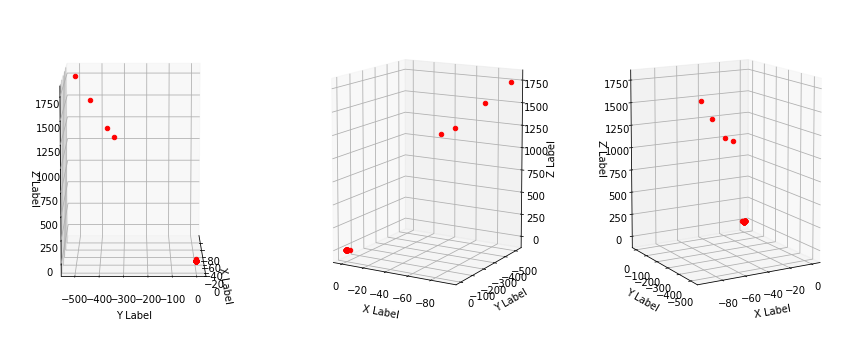

In [44]:
fig = plt.figure(figsize=(15, 6))
for i in range(3):
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.view_init(10, 360./3*i)
    for x, y, z in pts_3d:
        ax.scatter(x, y, z, c="r", marker="o")
plt.show()

Unfortunately, the interactive Matplotlib view doesn't seem to be working on Colab, so I displayed the data from three different viewpoints. You can play with `view_init` to maybe find better views of the scene.

If you did it right, you should see the same point cloud from different angles, which most points lying on a plane (the back wall), and a few other points sticking out (the keypoints on the fountain).

## 3.5 Where to go from here?

There is *so* much more to be done... but things are getting kind of complicated. We could easily spend another week or two on this, but we need to move on. The next step would be to calculate the reprojection error, and to keep adding views one-by-one and repeating the above procedure.

However, remember how we can reconstruct the scene only up to a scaling factor? That is going to be a big problem, because each pair of images might assume a different scaling factor, making it hard to align the points.
Bundle adjustment to the rescue! This is where the global optimization comes in.

If you are interested in seeing the whole process in action, check out the SfM demo from the Week 7 Discussion Section. OpenCV comes with a [SfM](https://docs.opencv.org/master/de/d7c/tutorial_table_of_content_sfm.html) module, but (as far as I know), it does not work with Python. More professional solutions include [Bundler](https://www.cs.cornell.edu/~snavely/bundler/), by the same author who reconstructed the colosseum. 